# Avaliação 1
___
## Modelo de RNA com dados de potência elétrica

Requisitos:
* Erro Percentual Absoluto Máximo menor que 10%
* Erro Percentual Absoluto Médio menor que 5%

**Disciplina:** Automação Inteligente

**Autor:** Miguel Marques Ferreira

**GitHub:** https://github.com/Miguel-mmf

## Bibliotecas

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import rcParams
plt.style.use('default')
rcParams.update(
    {
        'figure.figsize':(16,5),
        'figure.facecolor':'white',
        # 'font.size':'12',
        'axes.grid': True,
        'axes.grid.axis': 'both',
        # 'text.usetex' : True,
        # 'font.family' : 'serif',
        # 'font.serif' : 'cm'
    }
)

from sklearn.preprocessing import MinMaxScaler
from distutils.dir_util import mkpath
from sklearn.metrics import (
    mean_absolute_error,
    mean_absolute_percentage_error,
    mean_squared_error,
    max_error
)
from sklearn.model_selection import train_test_split
from kerastuner import Objective
from kerastuner.tuners import RandomSearch

%matplotlib inline

2024-02-26 16:31:43.782104: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-26 16:31:43.807717: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-26 16:31:43.807743: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-26 16:31:43.807774: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-26 16:31:43.813677: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-02-26 16:31:43.814071: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

## Funções de apoio

In [2]:
def scale_data(df, scalers=None, scaler_type='minmax'):
    """
    Scales a dataset using either MinMaxScaler, StandardScaler or QuantileTransformer from scikit-learn.

    Parameters:
    df (pandas.DataFrame): The dataset to be scaled.
    scaler_type (str): The type of scaler to use. Either 'minmax', 'standard' or 'quantile'.

    Test:
    for s in scalers.values():
        print(s.get_params(True), end=' | ')
        print(s.data_min_, end=' | ')
        print(s.data_max_)

    Returns:
    pandas.DataFrame: The scaled dataset.
    dict: A scalers dict.
    """

    df_norm = pd.DataFrame()

    if scalers:

        for col in df.columns:
            feat = np.array(df[col])
            aux = feat.shape
            data = scalers[col].transform(feat.reshape(-1,1)) # f.transform(feat)
            df_norm[col] = data.reshape(aux)

        return df_norm

    else: # shift nas linhas abaixo

        scalers = dict()
        for col in df.columns:

            if scaler_type == 'minmax':
                scaler = MinMaxScaler(feature_range=(0.15,0.85)) # default
            # elif scaler_type == 'standard':
            #     scaler = StandardScaler()
            # elif scaler_type == 'quantile':
            #     scaler = QuantileTransformer()
            else:
                raise ValueError("Invalid scaler type. Must be 'minmax', 'standard' or 'quantile'.")

            scalers[col] = scaler
            feat = np.array(df[col])
            aux = feat.shape
            data = scalers[col].fit_transform(feat.reshape(-1,1)) # f.transform(feat)
            df_norm[col] = data.reshape(aux)

        return df_norm, scalers

In [3]:
def difference_plot(
        real_data,
        predicted_data,
        xy_labels={
            'x': 'Pontos',
            'y': 'Potência (MW)'
        },
        legends={
            'ax0': ['Potência Real','Potência Estimada'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
        filename=' ',
        save=False,
        formats=['eps', 'png', 'pdf'],
        return_fig=False
    ):
    """This function creates a figure with two subplots: the first one shows the real and predicted data, and the second one shows the difference between the real and predicted data.

    Args:
        real_data (Series): A series with the real data.
        predicted_data (Series): A series with the predicted data.
        xy_labels (dict, optional): _description_. Defaults to { 'x': 'Pontos', 'y': 'Potência (MW)' }.
        legends (dict, optional): _description_. Defaults to { 'ax0': ['Potência Real','Potência Estimada'], 'ax1': ['Diferença entre Potência Real e Estimada'] }.
        filename (str, optional): _description_. Defaults to ' '.
        save (bool, optional): _description_. Defaults to False.
        formats (list, optional): _description_. Defaults to ['eps', 'png', 'pdf'].
        return_fig (bool, optional): _description_. Defaults to False.

    Returns:
        matplotlib.figure.Figure: A figure with two subplots.
    """

    fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=600, sharex=True)

    axs[0].plot(real_data, lw=2, color='Red', marker='s', markersize=3)
    axs[0].plot(predicted_data, lw=2, color='Blue')

    axs[1].plot(real_data - predicted_data, lw=2, color='red')
    axs[1].fill_between(
        range(0, len(predicted_data)),
        (real_data - predicted_data).ravel(),
        lw=2,
        color='red',
        alpha=0.5
    )

    for i in range(2):
        axs[i].grid(True)
        axs[i].set_ylabel(xy_labels['y'])
        axs[i].set_xlabel(xy_labels['x'])
        axs[i].legend(legends[f'ax{i}'])

    plt.tight_layout()

    if save:
        if filename == ' ':
            f = './figures/difference_plot'
        else:
            mkpath('/'.join(filename.split('/')[:-1]))
            f = filename

        for format in formats:
            plt.savefig(f'{f}.{format}', format=format, dpi=600)


    if return_fig:
        return fig, axs
    else:
        plt.show()

In [4]:
def create_mae_mse_rmse_figures(df_history, save=False, filename=' ', return_fig=False):
    """This function creates the MAE, MSE and RMSE figures for the training and validation sets.

    Args:
        df_history (DataFrame): The history of the training and validation sets.
        save (bool, optional): The flag to save the figures. Defaults to False.
        filename (str, optional): The filename to save the figures. Defaults to ' '.
    """

    cols = df_history.columns
    length_df_history = len(df_history)
    metrics = {
        'mae': 'mean_absolute_error',
        'mse': 'mean_squared_error',
        'rmse': 'root_mean_squared_error',
        # 'mape': 'mean_absolute_percentage_error',
    }

    figs = list()
    axss = list()

    for key, value in metrics.items():
        
        fig, axs = plt.subplots(1,1,figsize=(12,5),dpi=600)
        
        if key in cols:
            axs.plot(df_history[key],lw=2,color='red', label=f'Training {key.upper()}')
            axs.plot(df_history[f'val_{key}'],lw=2,color='blue', label=f'Validation {key.upper()}')
        else:
            try:
                axs.plot(df_history[value],lw=2,color='red', label=f'Training {key.upper()}')
                axs.plot(df_history[f'val_{value}'],lw=2,color='blue', label=f'Validation {key.upper()}')
            except Exception as e:
                print(e)

        axs.grid(True)
        axs.set_ylabel(key.upper(), fontsize=22)
        axs.set_xlabel('Epochs', fontsize=22)
        axs.set_xlim([0, length_df_history+1])
        # axs.set_xticks([i for i in range(0,length_df_history,2)], fontsize=20)
        axs.legend(fontsize=18)
        axs.grid(visible=True)

        figs.append(fig)
        axss.append(axs)
        
        if save:
            if filename == ' ':
                f = key.upper()
            else:
                f = filename + '_' + key.upper()
            #plt.savefig(f'{filename}.eps', format='eps', dpi=600)
            plt.savefig(f'{f}.png', format='png', dpi=600)
            #plt.savefig(f'{filename}.pdf', format='pdf', dpi=600) 

    if save:
        if filename == ' ':
            f = 'history.csv'
        else:
            f = filename + 'history.csv'

        df_history.to_csv(f)

    if return_fig:
        return figs, axss

In [5]:
def max_absolute_percentage_error(y_true, y_pred):

    # errors = list()
    y_pred = y_pred.to_numpy().reshape(1, -1)
    y_true = y_true.to_numpy().reshape(1, -1)
    epsilon = np.finfo(np.float64).eps
    max_ape = np.abs(y_pred - y_true) / np.maximum(np.abs(y_true), epsilon)
    max_ape = np.max(max_ape)

    return max_ape

In [6]:
def build_MLP_model(
        input_shape=(7),
        output_shape=(2),
        input_units=[25,16],
        activation='relu',
        name='MLP_Model'
    ):
    
    tf.keras.backend.clear_session()

    model = tf.keras.Sequential(name=name)
    model.add(tf.keras.layers.Input(input_shape, name='Input_Layer'))
    
    for index, units in enumerate(input_units):
        model.add(
            tf.keras.layers.Dense(
                units=units,
                activation=activation,
                name=f'Dense_{index}'
            )
        )
    # model.add(
    #     tf.keras.layers.Dense(
    #         units = hp.Int('units', min_value=1, max_value=100, step=1),
    #         # activation = hp.Choice('activation', values=['relu','sigmoid']),
    #         activation= activation,
    #         input_shape=(input_shape,)
    #     )
    # )

    model.add(tf.keras.layers.Dense(output_shape, activation=activation))

    model.compile(
        optimizer='adam',
        loss='mse',
        metrics=[
            'mae',
            'mse',
            tf.keras.metrics.RootMeanSquaredError(name='root_mean_squared_error'),
        ]
    )

    return model

## Leitura dos dados de treinamento, validação e teste

In [7]:
!ls automacao_inteligente/data

rna1  x_test.csv   x_valid.csv	y_train.csv
rna2  x_train.csv  y_test.csv	y_valid.csv


In [8]:
x_train = pd.read_csv('automacao_inteligente/data/rna1/x_train.csv', index_col=0)
y_train = pd.read_csv('automacao_inteligente/data/rna1/y_train.csv', index_col=0)

x_valid = pd.read_csv('automacao_inteligente/data/rna1/x_valid.csv', index_col=0)
y_valid = pd.read_csv('automacao_inteligente/data/rna1/y_valid.csv', index_col=0)

x_test = pd.read_csv('automacao_inteligente/data/rna1/x_test.csv', index_col=0)
y_test = pd.read_csv('automacao_inteligente/data/rna1/y_test.csv', index_col=0)

In [9]:
x_train_scaled, x_scalers = scale_data(x_train, scaler_type='minmax')
y_train_scaled, y_scalers = scale_data(y_train, scaler_type='minmax')

x_valid_scaled = scale_data(x_valid, x_scalers)
y_valid_scaled = scale_data(y_valid, y_scalers)

x_test_scaled = scale_data(x_test, x_scalers)
y_test_scaled = scale_data(y_test, y_scalers)

In [10]:
print(f'Shape x_train: {x_train.shape}')
print(f'Shape y_train: {y_train.shape}')
print(f'Shape x_valid: {x_valid.shape}')
print(f'Shape y_valid: {y_valid.shape}')
print(f'Shape x_test: {x_test.shape}')
print(f'Shape y_test: {y_test.shape}')

Shape x_train: (215, 10)
Shape y_train: (215, 2)
Shape x_valid: (46, 10)
Shape y_valid: (46, 2)
Shape x_test: (47, 10)
Shape y_test: (47, 2)


## Modelo RNA 1

### `relu`

In [11]:
RNA_MLP_1_relu = build_MLP_model(
    input_shape=(x_train_scaled.shape[1]),
    output_shape=(y_train_scaled.shape[1]),
    input_units=[25,16],
    activation='relu',
    name='RNA_MLP_1_relu'
)

RNA_MLP_1_relu.summary()

Model: "RNA_MLP_1_relu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_0 (Dense)             (None, 25)                275       
                                                                 
 Dense_1 (Dense)             (None, 16)                416       
                                                                 
 dense (Dense)               (None, 2)                 34        
                                                                 
Total params: 725 (2.83 KB)
Trainable params: 725 (2.83 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


2024-02-26 16:31:55.697639: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:894] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-26 16:31:55.730136: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2211] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [12]:
history_RNA_MLP_1_relu = RNA_MLP_1_relu.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    epochs=500,
    validation_data=(
        x_valid_scaled,
        y_valid_scaled
    ),
)

Epoch 1/500


7/7 [==============================] - 0s 18ms/step - loss: 0.2587 - mae: 0.4827 - mse: 0.2587 - root_mean_squared_error: 0.5087 - val_loss: 0.1863 - val_mae: 0.4056 - val_mse: 0.1863 - val_root_mean_squared_error: 0.4317
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 0.1160 - mae: 0.3097 - mse: 0.1160 - root_mean_squared_error: 0.3406 - val_loss: 0.0717 - val_mae: 0.2383 - val_mse: 0.0717 - val_root_mean_squared_error: 0.2677
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0398 - mae: 0.1660 - mse: 0.0398 - root_mean_squared_error: 0.1996 - val_loss: 0.0218 - val_mae: 0.1202 - val_mse: 0.0218 - val_root_mean_squared_error: 0.1478
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0110 - mae: 0.0822 - mse: 0.0110 - root_mean_squared_error: 0.1047 - val_loss: 0.0074 - val_mae: 0.0684 - val_mse: 0.0074 - val_root_mean_squared_error: 0.0860
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0075 -

In [13]:
history_RNA_MLP_1_relu_df = pd.DataFrame(history_RNA_MLP_1_relu.history)
history_RNA_MLP_1_relu_df.head()

,loss,mae,mse,root_mean_squared_error,val_loss,val_mae,val_mse,val_root_mean_squared_error
0,0.258737,0.482706,0.258737,0.508662,0.186334,0.405630,0.186334,0.431665
1,0.116004,0.309720,0.116004,0.340593,0.071663,0.238324,0.071663,0.267699
2,0.039825,0.166030,0.039825,0.199563,0.021848,0.120179,0.021848,0.147810
3,0.010970,0.082165,0.010970,0.104737,0.007400,0.068366,0.007400,0.086026
4,0.007478,0.066013,0.007478,0.086474,0.006531,0.057195,0.006531,0.080814


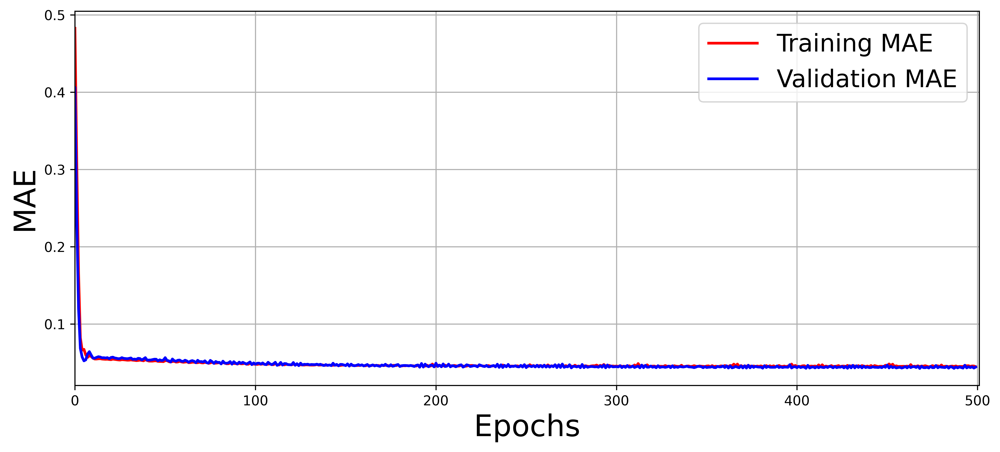

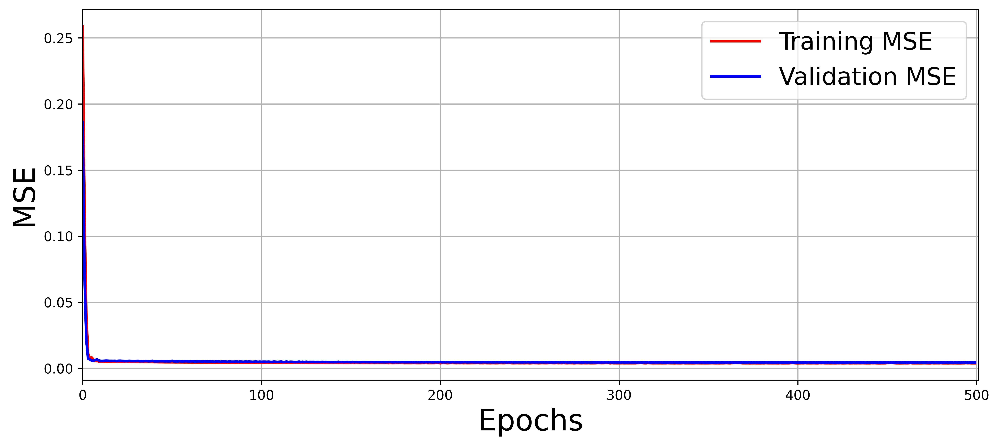

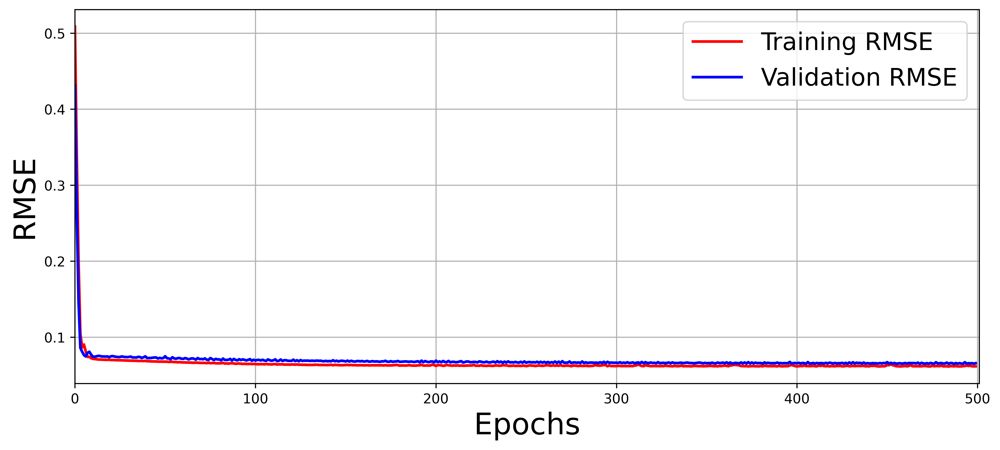

In [14]:
create_mae_mse_rmse_figures(
    history_RNA_MLP_1_relu_df,
    save=True,
    filename='./automacao_inteligente/rna1/ent3_relu',
)

##### Avaliação do conjunto de teste

In [15]:
df_real_previsto = y_test.copy()
df_real_previsto.reset_index(inplace=True)
df_real_previsto.drop(columns=['TEMPO', 'index','level_0'], inplace=True, errors='ignore')
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2)
0,16.700001,16.900000
1,19.600000,19.200001
2,19.900000,19.700001
3,20.000000,18.600000
4,18.600000,18.100000


In [16]:
y_predicted = RNA_MLP_1_relu.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 1ms/step


(47, 2)

In [17]:
df_real_previsto['previsto K+1 relu'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto['previsto K+2 relu'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

In [18]:
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 relu,previsto K+2 relu
0,16.700001,16.900000,16.343538,16.350517
1,19.600000,19.200001,19.466501,19.392668
2,19.900000,19.700001,19.723421,19.781006
3,20.000000,18.600000,18.597389,18.730852
4,18.600000,18.100000,18.397135,18.310575


/tmp/ipykernel_1125671/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


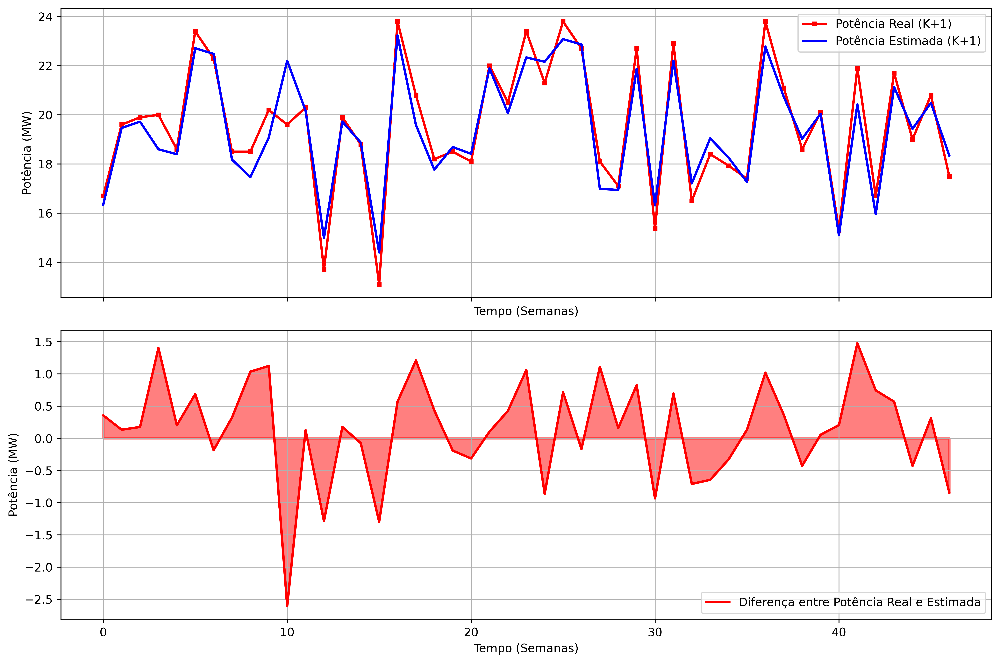

In [19]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+1)'],
    predicted_data=df_real_previsto['previsto K+1 relu'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/ent3/real_previsto_k1_relu',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

/tmp/ipykernel_1125671/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


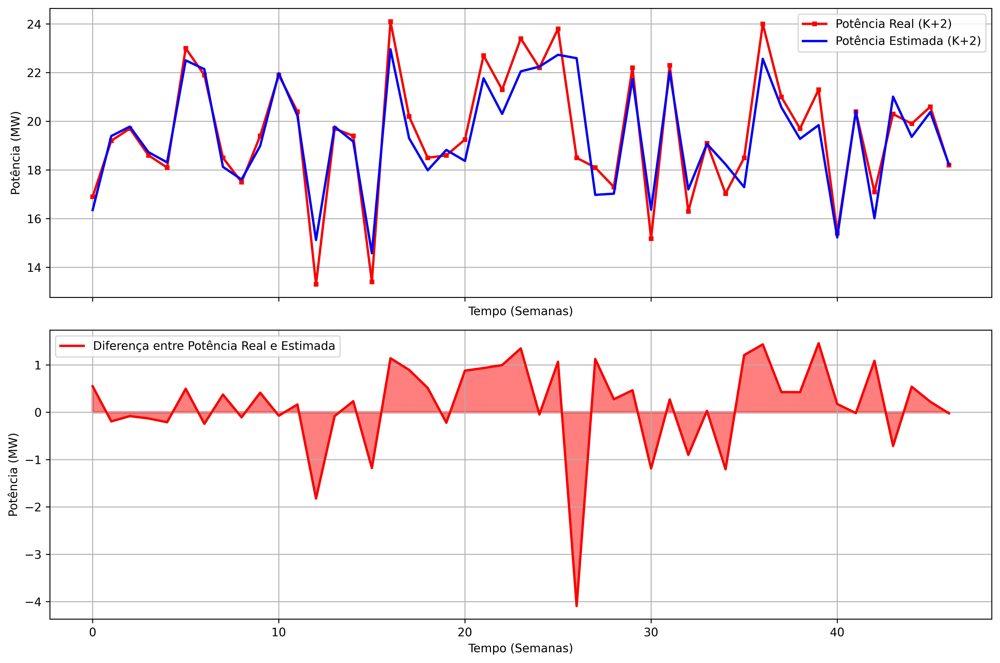

In [20]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+2)'],
    predicted_data=df_real_previsto['previsto K+2 relu'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/ent3/real_previsto_k2_relu',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

In [21]:
df_real_previsto.to_csv('./automacao_inteligente/rna1/ent3/df_real_previsto.csv', index=False)

#### Métricas de avaliação

In [22]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 relu'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 relu'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 relu']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 relu'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 relu'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 relu'])*100}")

MAE: 0.621945208157568
MSE: 0.6342329500097874
RMSE: 0.7963874371245364
MAXE: 2.6046409606933842

MAPE: 3.270772557097716
Max_APE: 13.28898423469355


In [23]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 relu'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 relu'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 relu']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 relu'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 relu'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 relu'])*100}")

MAE: 0.6735187997209241
MSE: 0.9349590253582755
RMSE: 0.9669327925757175
MAXE: 4.092853546142578

MAPE: 3.5962973507829012
Max_APE: 22.123532681851774


In [ ]:
0.6735187997209241
0.9349590253582755
0.9669327925757175
4.092853546142578
3.5962973507829012
22.123532681851774

### `sigmoid`

In [24]:
RNA_MLP_1_sigmoid = build_MLP_model(
    input_shape=(x_train_scaled.shape[1]),
    output_shape=(y_train_scaled.shape[1]),
    input_units=[25,16],
    activation='sigmoid',
    name='RNA_MLP_1_sigmoid'
)

RNA_MLP_1_sigmoid.summary()

Model: "RNA_MLP_1_sigmoid"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_0 (Dense)             (None, 25)                275       
                                                                 
 Dense_1 (Dense)             (None, 16)                416       
                                                                 
 dense (Dense)               (None, 2)                 34        
                                                                 
Total params: 725 (2.83 KB)
Trainable params: 725 (2.83 KB)
Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [25]:
history_RNA_MLP_1_sigmoid = RNA_MLP_1_sigmoid.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    epochs=500,
    validation_data=(
        x_valid_scaled.to_numpy(),
        y_valid_scaled.to_numpy()
    ),
)

Epoch 1/500


7/7 [==============================] - 0s 15ms/step - loss: 0.0432 - mae: 0.1718 - mse: 0.0432 - root_mean_squared_error: 0.2078 - val_loss: 0.0429 - val_mae: 0.1680 - val_mse: 0.0429 - val_root_mean_squared_error: 0.2071
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0362 - mae: 0.1577 - mse: 0.0362 - root_mean_squared_error: 0.1902 - val_loss: 0.0368 - val_mae: 0.1564 - val_mse: 0.0368 - val_root_mean_squared_error: 0.1918
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0310 - mae: 0.1454 - mse: 0.0310 - root_mean_squared_error: 0.1760 - val_loss: 0.0328 - val_mae: 0.1499 - val_mse: 0.0328 - val_root_mean_squared_error: 0.1810
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0278 - mae: 0.1367 - mse: 0.0278 - root_mean_squared_error: 0.1667 - val_loss: 0.0304 - val_mae: 0.1473 - val_mse: 0.0304 - val_root_mean_squared_error: 0.1745
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0260 -

In [26]:
history_RNA_MLP_1_sigmoid_df = pd.DataFrame(history_RNA_MLP_1_sigmoid.history)
history_RNA_MLP_1_sigmoid_df.head()

,loss,mae,mse,root_mean_squared_error,val_loss,val_mae,val_mse,val_root_mean_squared_error
0,0.043173,0.171761,0.043173,0.207782,0.042901,0.168031,0.042901,0.207125
1,0.036163,0.157745,0.036163,0.190165,0.036803,0.156449,0.036803,0.191840
2,0.030983,0.145438,0.030983,0.176019,0.032779,0.149935,0.032779,0.181048
3,0.027786,0.136692,0.027786,0.166691,0.030434,0.147330,0.030434,0.174455
4,0.026043,0.131227,0.026043,0.161379,0.029355,0.146180,0.029355,0.171332


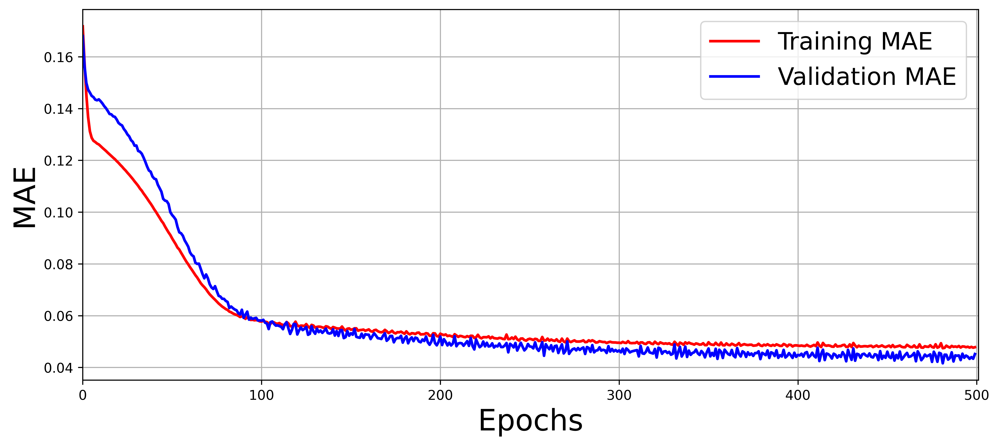

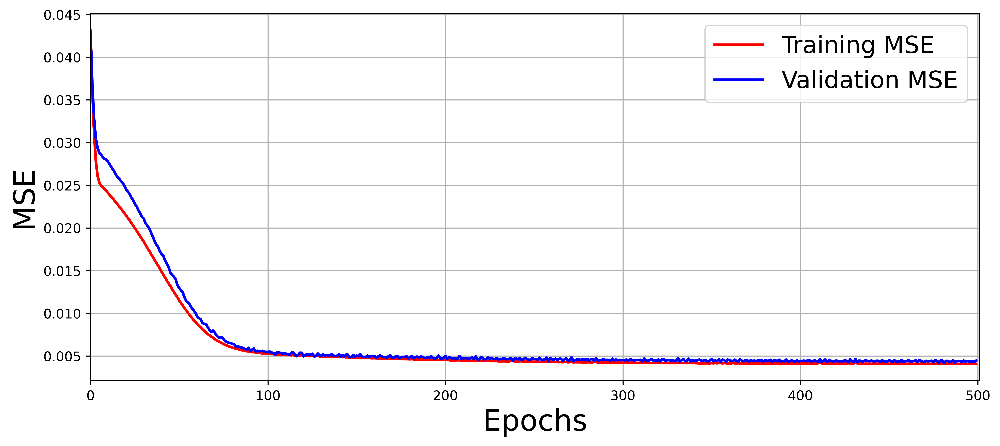

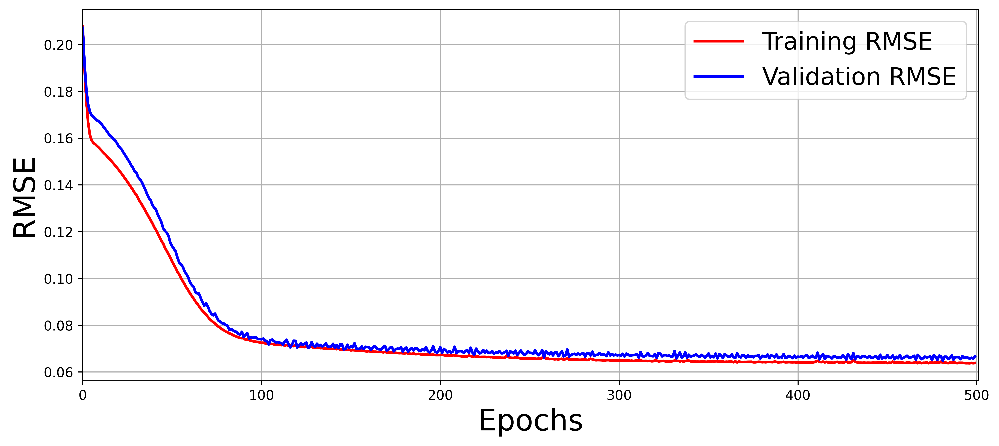

In [27]:
create_mae_mse_rmse_figures(
    history_RNA_MLP_1_sigmoid_df,
    save=True,
    filename='./automacao_inteligente/rna1/ent3_sigmoid',
)

##### Avaliação do conjunto de teste

In [28]:
y_predicted = RNA_MLP_1_sigmoid.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 919us/step


(47, 2)

In [29]:
df_real_previsto['previsto K+1 sigmoid'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto['previsto K+2 sigmoid'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

In [30]:
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 relu,previsto K+2 relu,previsto K+1 sigmoid,previsto K+2 sigmoid
0,16.700001,16.900000,16.343538,16.350517,16.270031,16.423325
1,19.600000,19.200001,19.466501,19.392668,19.401867,19.425138
2,19.900000,19.700001,19.723421,19.781006,19.855366,19.870359
3,20.000000,18.600000,18.597389,18.730852,18.519011,18.587706
4,18.600000,18.100000,18.397135,18.310575,18.293531,18.351536


/tmp/ipykernel_1125671/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


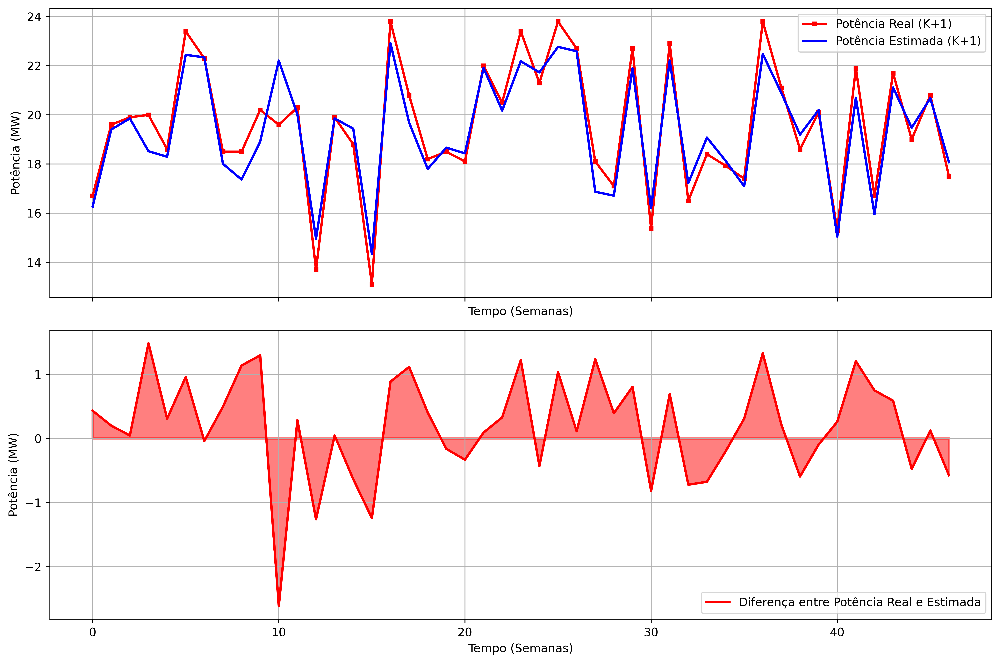

In [31]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+1)'],
    predicted_data=df_real_previsto['previsto K+1 sigmoid'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/ent3/real_previsto_k1_sigmoid',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

/tmp/ipykernel_1125671/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


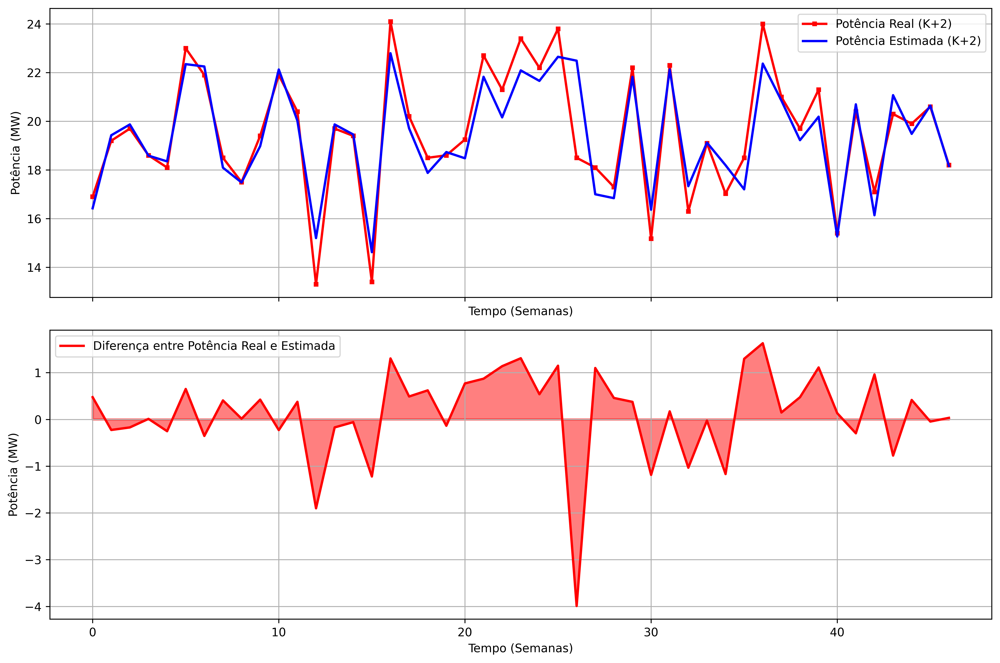

In [32]:
difference_plot(
    real_data=df_real_previsto['POTENCIA(K+2)'],
    predicted_data=df_real_previsto['previsto K+2 sigmoid'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna1/ent3/real_previsto_k2_sigmoid',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

In [33]:
df_real_previsto.to_csv('./automacao_inteligente/rna1/ent3/df_real_previsto.csv', index=False)

#### Métricas de avaliação

In [34]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 sigmoid'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 sigmoid'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 sigmoid']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 sigmoid'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 sigmoid'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+1)'],df_real_previsto['previsto K+1 sigmoid'])*100}")

MAE: 0.6508340525867495
MSE: 0.6797817805810171
RMSE: 0.8244887995485549
MAXE: 2.6100006103515874

MAPE: 3.4093449240715485
Max_APE: 13.316329385478701


In [35]:
print(f"MAE: {mean_absolute_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 sigmoid'])}")
print(f"MSE: {mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 sigmoid'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 sigmoid']))}")
print(f"MAXE: {max_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 sigmoid'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 sigmoid'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto['POTENCIA(K+2)'],df_real_previsto['previsto K+2 sigmoid'])*100}")

MAE: 0.6829880754998405
MSE: 0.9338236955083657
RMSE: 0.9663455362903922
MAXE: 3.990314483642578

MAPE: 3.6368433387981938
Max_APE: 21.569267479149072


0.6829880754998405
0.9338236955083657
0.9663455362903922
3.990314483642578
3.6368433387981938
21.569267479149072

## Modelo RNA 2

In [91]:
x_train = pd.read_csv('automacao_inteligente/data/rna2/x_train.csv', index_col=0)
y_train = pd.read_csv('automacao_inteligente/data/rna2/y_train.csv', index_col=0)

x_valid = pd.read_csv('automacao_inteligente/data/rna2/x_valid.csv', index_col=0)
y_valid = pd.read_csv('automacao_inteligente/data/rna2/y_valid.csv', index_col=0)

x_test = pd.read_csv('automacao_inteligente/data/rna2/x_test.csv', index_col=0)
y_test = pd.read_csv('automacao_inteligente/data/rna2/y_test.csv', index_col=0)
x_train_scaled, x_scalers = scale_data(x_train, scaler_type='minmax')
y_train_scaled, y_scalers = scale_data(y_train, scaler_type='minmax')

x_valid_scaled = scale_data(x_valid, x_scalers)
y_valid_scaled = scale_data(y_valid, y_scalers)

x_test_scaled = scale_data(x_test, x_scalers)
y_test_scaled = scale_data(y_test, y_scalers)

In [92]:
print(f'Shape x_train: {x_train.shape}')
print(f'Shape y_train: {y_train.shape}')
print(f'Shape x_valid: {x_valid.shape}')
print(f'Shape y_valid: {y_valid.shape}')
print(f'Shape x_test: {x_test.shape}')
print(f'Shape y_test: {y_test.shape}')

Shape x_train: (215, 14)
Shape y_train: (215, 2)
Shape x_valid: (46, 14)
Shape y_valid: (46, 2)
Shape x_test: (47, 14)
Shape y_test: (47, 2)


### `relu`

In [93]:
RNA_MLP_2_relu = build_MLP_model(
    input_shape=(x_train_scaled.shape[1]),
    output_shape=(y_train_scaled.shape[1]),
    input_units=[25,16],
    activation='relu',
    name='RNA_MLP_2_relu'
)

RNA_MLP_2_relu.summary()

Model: "RNA_MLP_2_relu"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_0 (Dense)             (None, 25)                375       
                                                                 
 Dense_1 (Dense)             (None, 16)                416       
                                                                 
 dense (Dense)               (None, 2)                 34        
                                                                 
Total params: 825 (3.22 KB)
Trainable params: 825 (3.22 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [95]:
history_RNA_MLP_2_relu = RNA_MLP_2_relu.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    epochs=500,
    validation_data=(
        x_valid_scaled.to_numpy(),
        y_valid_scaled.to_numpy()
    ),
)

Epoch 1/500


7/7 [==============================] - 0s 14ms/step - loss: 0.2185 - mae: 0.4467 - mse: 0.2185 - root_mean_squared_error: 0.4674 - val_loss: 0.1804 - val_mae: 0.4055 - val_mse: 0.1804 - val_root_mean_squared_error: 0.4247
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 0.1278 - mae: 0.3358 - mse: 0.1278 - root_mean_squared_error: 0.3575 - val_loss: 0.0984 - val_mae: 0.2921 - val_mse: 0.0984 - val_root_mean_squared_error: 0.3137
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0641 - mae: 0.2256 - mse: 0.0641 - root_mean_squared_error: 0.2531 - val_loss: 0.0457 - val_mae: 0.1879 - val_mse: 0.0457 - val_root_mean_squared_error: 0.2138
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0281 - mae: 0.1388 - mse: 0.0281 - root_mean_squared_error: 0.1677 - val_loss: 0.0198 - val_mae: 0.1125 - val_mse: 0.0198 - val_root_mean_squared_error: 0.1406
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0152 -

In [96]:
history_RNA_MLP_2_relu_df = pd.DataFrame(history_RNA_MLP_2_relu.history)
history_RNA_MLP_2_relu_df.head()

,loss,mae,mse,root_mean_squared_error,val_loss,val_mae,val_mse,val_root_mean_squared_error
0,0.218464,0.446699,0.218464,0.467401,0.180411,0.405521,0.180411,0.424749
1,0.127773,0.335815,0.127773,0.357453,0.098382,0.292117,0.098382,0.313659
2,0.064084,0.225585,0.064084,0.253148,0.045726,0.187949,0.045726,0.213837
3,0.028133,0.138803,0.028133,0.167729,0.019769,0.112489,0.019769,0.140601
4,0.015218,0.098821,0.015218,0.123362,0.011272,0.087125,0.011272,0.106171


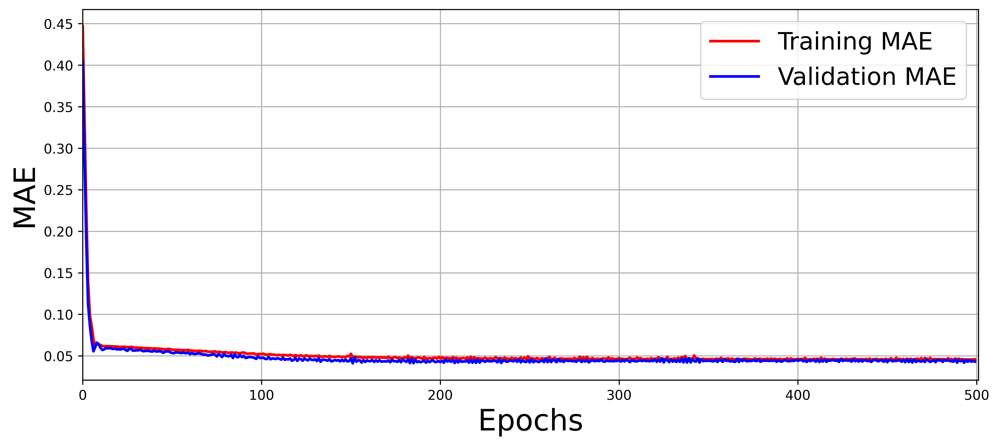

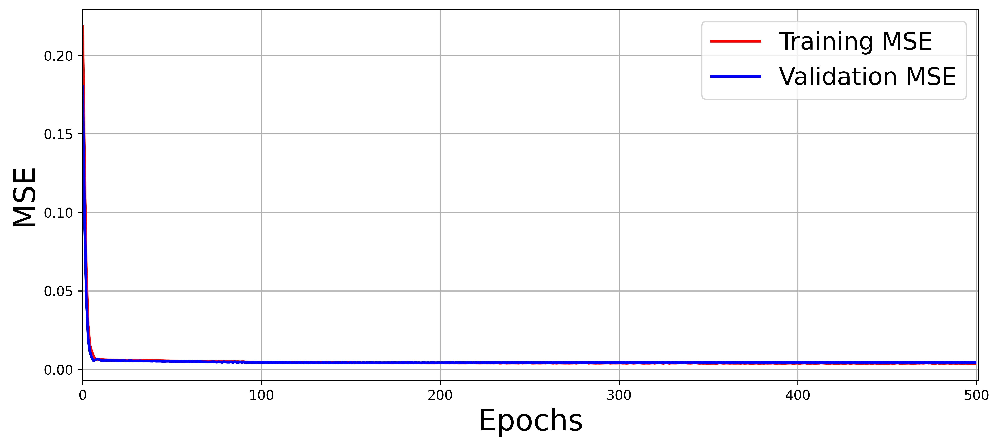

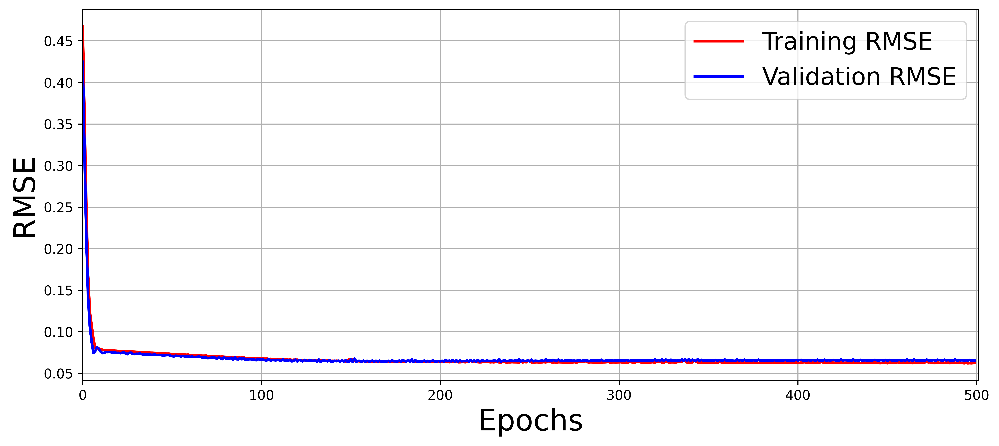

In [97]:
create_mae_mse_rmse_figures(
    history_RNA_MLP_2_relu_df,
    save=True,
    filename='./automacao_inteligente/rna2/ent3_relu',
)

##### Avaliação do conjunto de teste

In [98]:
df_real_previsto2 = y_test.copy()
df_real_previsto2.reset_index(inplace=True)
df_real_previsto2.drop(columns=['TEMPO', 'index','level_0'], inplace=True, errors='ignore')
df_real_previsto2.head()

,POTENCIA(K+1),POTENCIA(K+2)
0,16.700001,16.900000
1,19.600000,19.200001
2,19.900000,19.700001
3,20.000000,18.600000
4,18.600000,18.100000


In [99]:
y_predicted = RNA_MLP_2_relu.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 1ms/step


(47, 2)

In [100]:
df_real_previsto2['previsto K+1 relu'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto2['previsto K+2 relu'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

In [101]:
df_real_previsto.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 relu,previsto K+2 relu,previsto K+1 sigmoid,previsto K+2 sigmoid
0,16.700001,16.900000,10.5,16.588642,16.315437,16.441401
1,19.600000,19.200001,10.5,19.757290,19.413086,19.450354
2,19.900000,19.700001,10.5,19.953083,19.918289,19.944628
3,20.000000,18.600000,10.5,18.868275,18.570244,18.655210
4,18.600000,18.100000,10.5,18.509235,18.281984,18.347204


/tmp/ipykernel_2392294/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


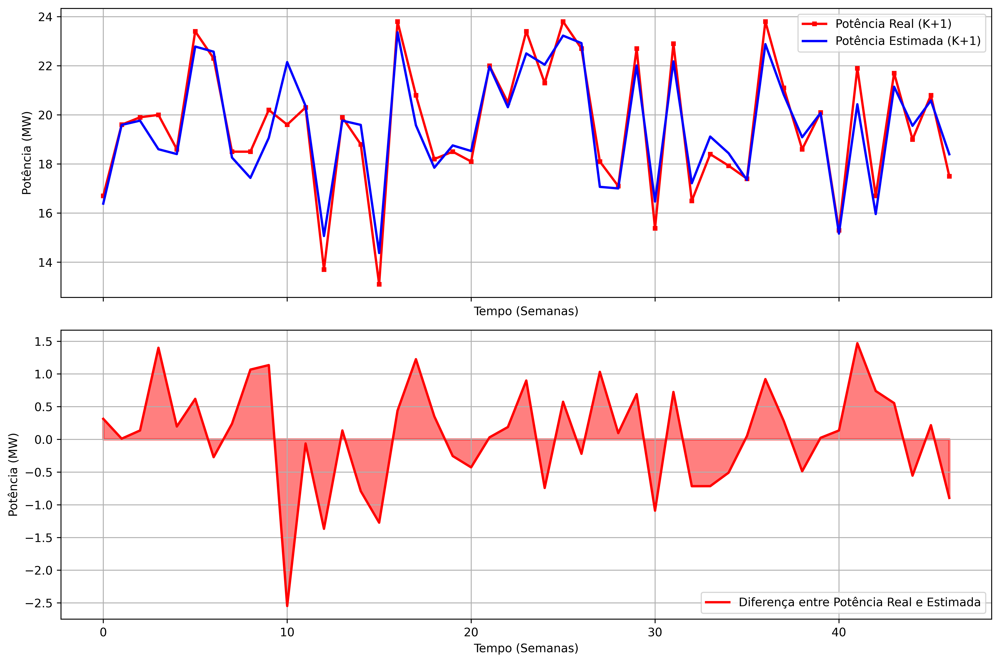

In [102]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+1)'],
    predicted_data=df_real_previsto2['previsto K+1 relu'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/ent3/real_previsto_k1_relu',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

/tmp/ipykernel_2392294/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


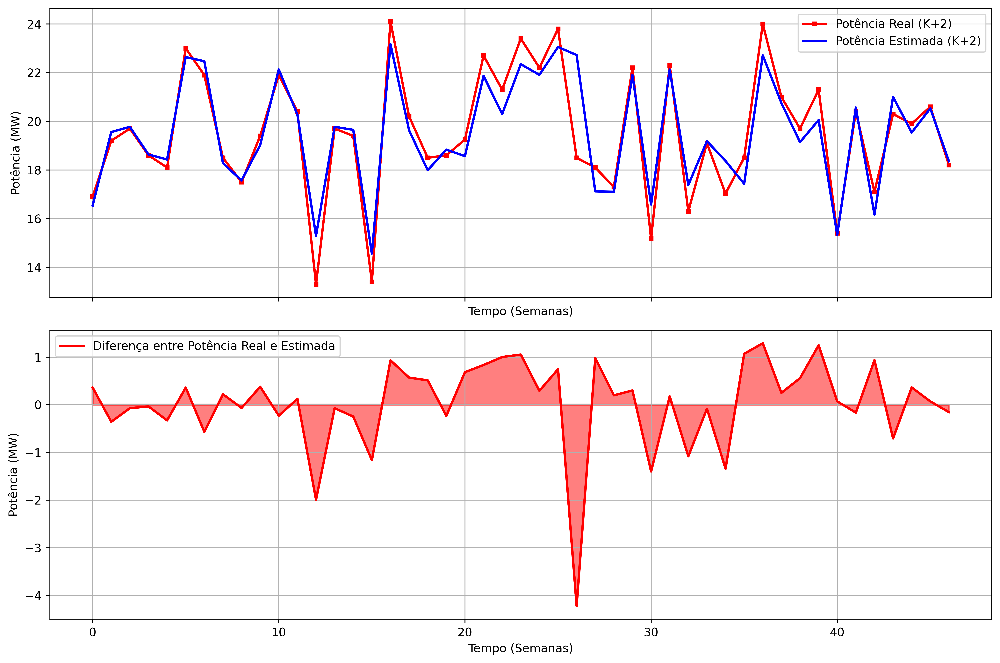

In [103]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+2)'],
    predicted_data=df_real_previsto2['previsto K+2 relu'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/ent3/real_previsto_k2_relu',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

In [104]:
df_real_previsto2.to_csv('./automacao_inteligente/rna2/ent3/df_real_previsto.csv', index=False)

#### Métricas de avaliação

In [105]:
print(f"MAE: {mean_absolute_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 relu'])}")
print(f"MSE: {mean_squared_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 relu'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 relu']))}")
print(f"MAXE: {max_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 relu'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 relu'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 relu'])*100}")

MAE: 0.6133742732937694
MSE: 0.6261953064819095
RMSE: 0.7913250321340211
MAXE: 2.547414779663111

MAPE: 3.2516365891719268
Max_APE: 12.997013928997145


In [106]:
print(f"MAE: {mean_absolute_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 relu'])}")
print(f"MSE: {mean_squared_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 relu'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 relu']))}")
print(f"MAXE: {max_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 relu'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 relu'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 relu'])*100}")

MAE: 0.640407856474531
MSE: 0.8956274303634244
RMSE: 0.9463759455752372
MAXE: 4.222288131713867

MAPE: 3.459033868833846
Max_APE: 22.823179090345228


### `sigmoid`

In [107]:
RNA_MLP_2_sigmoid = build_MLP_model(
    input_shape=(x_train_scaled.shape[1]),
    output_shape=(y_train_scaled.shape[1]),
    input_units=[25,16],
    activation='sigmoid',
    name='RNA_MLP_2_sigmoid'
)

RNA_MLP_2_sigmoid.summary()

Model: "RNA_MLP_2_sigmoid"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Dense_0 (Dense)             (None, 25)                375       
                                                                 
 Dense_1 (Dense)             (None, 16)                416       
                                                                 
 dense (Dense)               (None, 2)                 34        
                                                                 
Total params: 825 (3.22 KB)
Trainable params: 825 (3.22 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [108]:
history_RNA_MLP_2_sigmoid = RNA_MLP_2_sigmoid.fit(
    x=x_train_scaled,
    y=y_train_scaled,
    epochs=500,
    validation_data=(
        x_valid_scaled.to_numpy(),
        y_valid_scaled.to_numpy()
    ),
)

Epoch 1/500
7/7 [==============================] - 0s 14ms/step - loss: 0.0606 - mae: 0.2109 - mse: 0.0606 - root_mean_squared_error: 0.2463 - val_loss: 0.0660 - val_mae: 0.2254 - val_mse: 0.0660 - val_root_mean_squared_error: 0.2569
Epoch 2/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0482 - mae: 0.1857 - mse: 0.0482 - root_mean_squared_error: 0.2195 - val_loss: 0.0534 - val_mae: 0.2017 - val_mse: 0.0534 - val_root_mean_squared_error: 0.2312
Epoch 3/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0391 - mae: 0.1653 - mse: 0.0391 - root_mean_squared_error: 0.1977 - val_loss: 0.0443 - val_mae: 0.1841 - val_mse: 0.0443 - val_root_mean_squared_error: 0.2105
Epoch 4/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0331 - mae: 0.1506 - mse: 0.0331 - root_mean_squared_error: 0.1819 - val_loss: 0.0383 - val_mae: 0.1707 - val_mse: 0.0383 - val_root_mean_squared_error: 0.1956
Epoch 5/500
7/7 [==============================] - 0s 3ms/step - lo

7/7 [==============================] - 0s 3ms/step - loss: 0.0174 - mae: 0.1083 - mse: 0.0174 - root_mean_squared_error: 0.1319 - val_loss: 0.0201 - val_mae: 0.1223 - val_mse: 0.0201 - val_root_mean_squared_error: 0.1417
Epoch 40/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0172 - mae: 0.1076 - mse: 0.0172 - root_mean_squared_error: 0.1310 - val_loss: 0.0199 - val_mae: 0.1218 - val_mse: 0.0199 - val_root_mean_squared_error: 0.1409
Epoch 41/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0169 - mae: 0.1067 - mse: 0.0169 - root_mean_squared_error: 0.1299 - val_loss: 0.0195 - val_mae: 0.1206 - val_mse: 0.0195 - val_root_mean_squared_error: 0.1397
Epoch 42/500
7/7 [==============================] - 0s 3ms/step - loss: 0.0166 - mae: 0.1060 - mse: 0.0166 - root_mean_squared_error: 0.1289 - val_loss: 0.0191 - val_mae: 0.1191 - val_mse: 0.0191 - val_root_mean_squared_error: 0.1382
Epoch 43/500
7/7 [==============================] - 0s 3ms/step - loss: 0.016

In [109]:
history_RNA_MLP_2_sigmoid_df = pd.DataFrame(history_RNA_MLP_2_sigmoid.history)
history_RNA_MLP_2_sigmoid_df.head()

,loss,mae,mse,root_mean_squared_error,val_loss,val_mae,val_mse,val_root_mean_squared_error
0,0.060646,0.210949,0.060646,0.246265,0.066022,0.225440,0.066022,0.256948
1,0.048195,0.185699,0.048195,0.219533,0.053441,0.201652,0.053441,0.231173
2,0.039103,0.165330,0.039103,0.197745,0.044316,0.184054,0.044316,0.210514
3,0.033089,0.150597,0.033089,0.181904,0.038258,0.170737,0.038258,0.195597
4,0.029468,0.142162,0.029468,0.171661,0.034293,0.160277,0.034293,0.185184


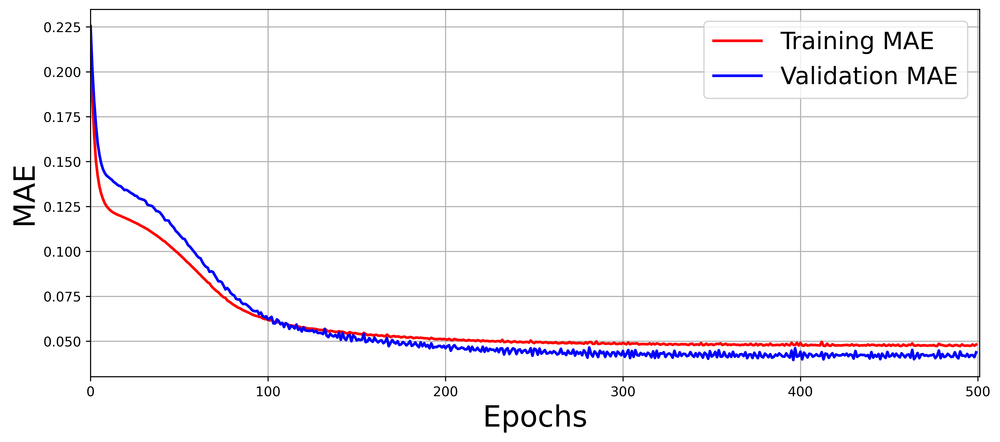

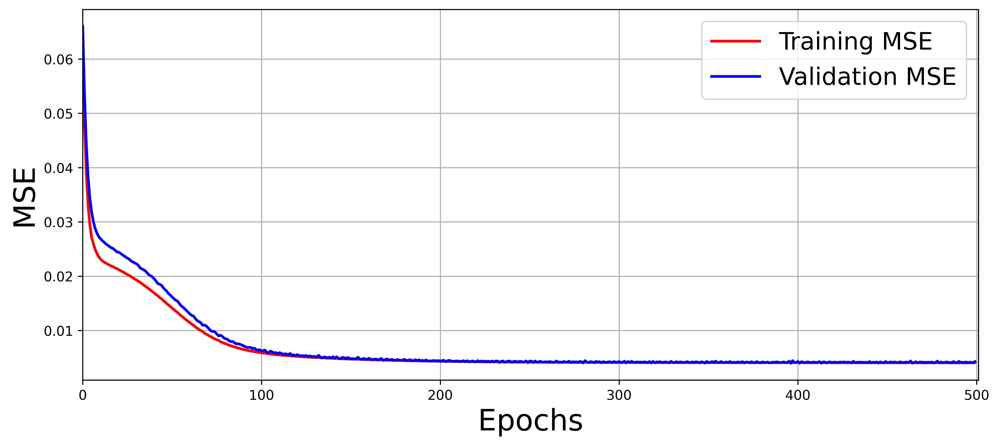

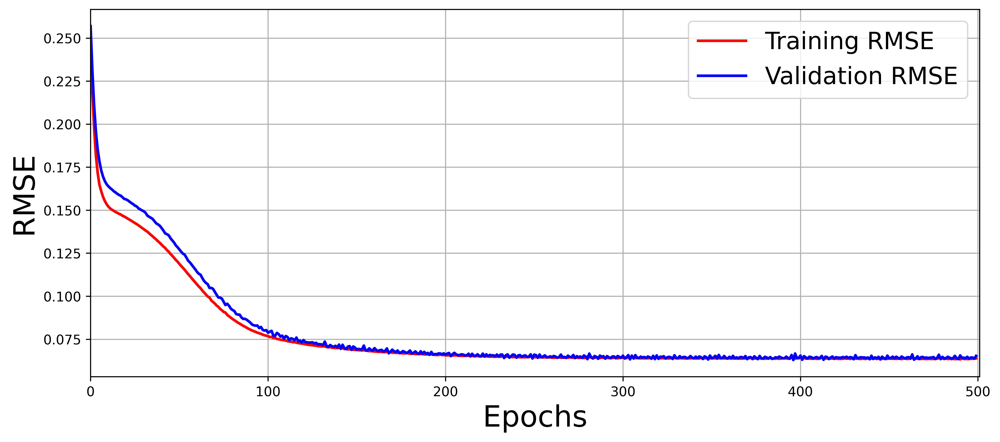

In [110]:
create_mae_mse_rmse_figures(
    history_RNA_MLP_2_sigmoid_df,
    save=True,
    filename='./automacao_inteligente/rna2/ent3_sigmoid',
)

##### Avaliação do conjunto de teste

In [111]:
y_predicted = RNA_MLP_2_sigmoid.predict(x_test_scaled)
y_predicted.shape

2/2 [==============================] - 0s 1ms/step


(47, 2)

In [112]:
df_real_previsto2['previsto K+1 sigmoid'] = y_scalers['POTENCIA(K+1)'].inverse_transform(y_predicted[:,0].reshape(-1, 1))
df_real_previsto2['previsto K+2 sigmoid'] = y_scalers['POTENCIA(K+2)'].inverse_transform(y_predicted[:,1].reshape(-1, 1))

In [113]:
df_real_previsto2.head()

,POTENCIA(K+1),POTENCIA(K+2),previsto K+1 relu,previsto K+2 relu,previsto K+1 sigmoid,previsto K+2 sigmoid
0,16.700001,16.900000,16.385759,16.539423,16.293098,16.428499
1,19.600000,19.200001,19.589441,19.557512,19.461807,19.481449
2,19.900000,19.700001,19.763887,19.772673,19.911636,19.908300
3,20.000000,18.600000,18.599895,18.635704,18.510120,18.582975
4,18.600000,18.100000,18.403225,18.428877,18.302752,18.379255


/tmp/ipykernel_2392294/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


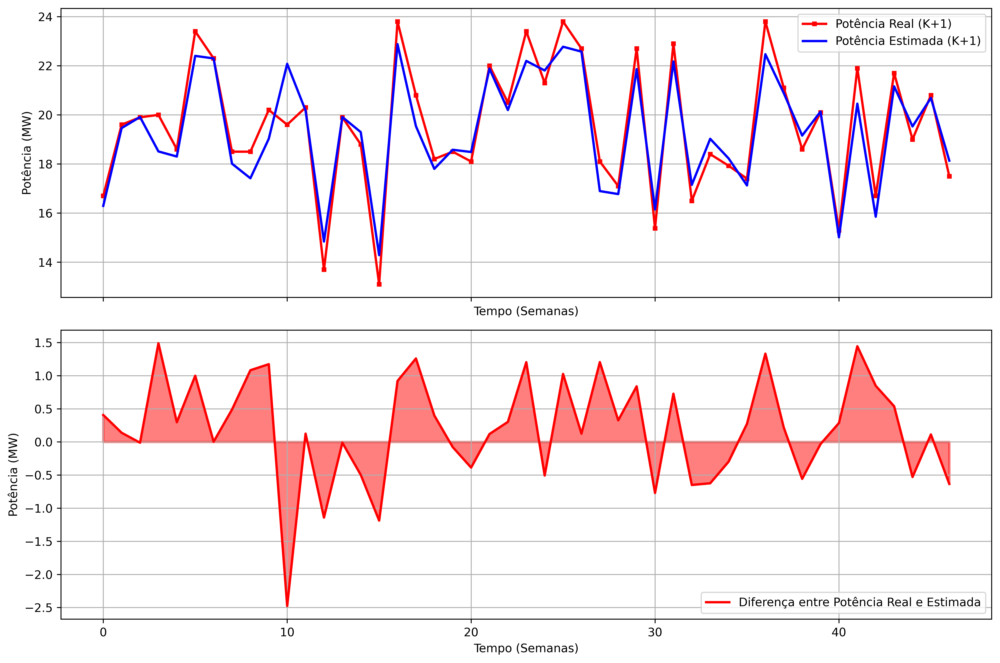

In [114]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+1)'],
    predicted_data=df_real_previsto2['previsto K+1 sigmoid'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+1)','Potência Estimada (K+1)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/ent3/real_previsto_k1_sigmoid',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

/tmp/ipykernel_2392294/291175701.py:41: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  (real_data - predicted_data).ravel(),


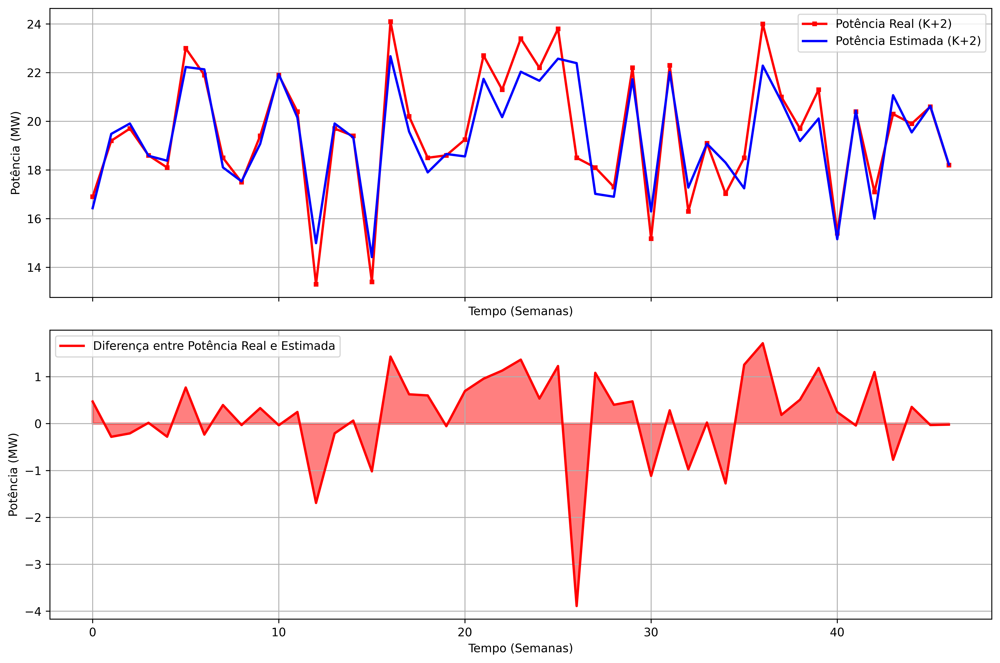

In [115]:
difference_plot(
    real_data=df_real_previsto2['POTENCIA(K+2)'],
    predicted_data=df_real_previsto2['previsto K+2 sigmoid'],
    xy_labels={
        'x': 'Tempo (Semanas)',
        'y': 'Potência (MW)'
    },
    legends={
            'ax0': ['Potência Real (K+2)','Potência Estimada (K+2)'],
            'ax1': ['Diferença entre Potência Real e Estimada']
        },
    filename='./automacao_inteligente/rna2/ent3/real_previsto_k2_sigmoid',
    save=True,
    formats=['png','pdf'],
    return_fig=False
)

In [116]:
df_real_previsto2.to_csv('./automacao_inteligente/rna2/ent3/df_real_previsto.csv', index=False)

#### Métricas de avaliação

In [117]:
print(f"MAE: {mean_absolute_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 sigmoid'])}")
print(f"MSE: {mean_squared_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 sigmoid'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 sigmoid']))}")
print(f"MAXE: {max_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 sigmoid'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 sigmoid'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto2['POTENCIA(K+1)'],df_real_previsto2['previsto K+1 sigmoid'])*100}")

MAE: 0.6404019715671208
MSE: 0.6676657905067127
RMSE: 0.8171081877613959
MAXE: 2.4767189025879155

MAPE: 3.3406150702575577
Max_APE: 12.636320685633576


In [118]:
print(f"MAE: {mean_absolute_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 sigmoid'])}")
print(f"MSE: {mean_squared_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 sigmoid'])}")
print(f"RMSE: {np.sqrt(mean_squared_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 sigmoid']))}")
print(f"MAXE: {max_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 sigmoid'])}")
print(f"\nMAPE: {mean_absolute_percentage_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 sigmoid'])*100}")
print(f"Max_APE: {max_absolute_percentage_error(df_real_previsto2['POTENCIA(K+2)'],df_real_previsto2['previsto K+2 sigmoid'])*100}")

MAE: 0.6772350656225322
MSE: 0.9203308262484726
RMSE: 0.9593387442652739
MAXE: 3.8894214630126953

MAPE: 3.579581769564486
Max_APE: 21.023899800068623


0.6772350656225322
0.9203308262484726
0.9593387442652739
3.8894214630126953
3.579581769564486
21.023899800068623

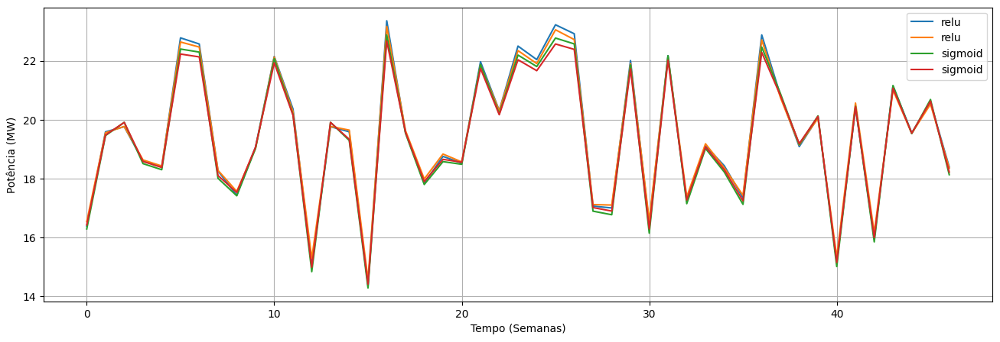

In [119]:
# Get the column names ending in "relu"
columns_relu = [col for col in df_real_previsto2.columns if col.endswith("relu")]

# Get the column names ending in "sigmoid"
columns_sigmoid = [col for col in df_real_previsto2.columns if col.endswith("sigmoid")]

# Plot the columns ending in "relu"
plt.plot(df_real_previsto2[columns_relu], label="relu")

# Plot the columns ending in "sigmoid"
plt.plot(df_real_previsto2[columns_sigmoid], label="sigmoid")

# Set the x-axis label
plt.xlabel("Tempo (Semanas)")

# Set the y-axis label
plt.ylabel("Potência (MW)")

# Set the legend
plt.legend()

# Show the plot
plt.show()
